In [1]:
%display plain
#%display latex

In [2]:
from matplotlib import cm
import numpy as np
from itertools import combinations
from __future__ import print_function

In [3]:
real_vars = var('r,t,theta,phi,x,y,z')
for rv in real_vars:
    assume(rv, 'real')

In [4]:
xs = var(['x{}'.format(n) for n in range(4)])
for xi in xs: assume(xi,'real')

ys = var(['y{}'.format(n) for n in range(3)])
for yi in ys: assume(yi,'real')
    
xs, ys

((x0, x1, x2, x3), (y0, y1, y2))

In [5]:
p1 = sum([xi   for xi in xs])
p2 = sum([xi^2 for xi in xs])
p3 = sum([xi^3 for xi in xs])
p4 = sum([xi^4 for xi in xs])

p1, p2, p3, p4

(x0 + x1 + x2 + x3,
 x0^2 + x1^2 + x2^2 + x3^2,
 x0^3 + x1^3 + x2^3 + x3^3,
 x0^4 + x1^4 + x2^4 + x3^4)

In [6]:
e1 = sum([ xi          for (xi,        ) in combinations(xs,1)])
e2 = sum([ xi*xj       for (xi,xj      ) in combinations(xs,2)])
e3 = sum([ xi*xj*xk    for (xi,xj,xk   ) in combinations(xs,3)])
e4 = sum([ xi*xj*xk*xl for (xi,xj,xk,xl) in combinations(xs,4)])

e1, e2, e3, e4

(x0 + x1 + x2 + x3,
 x0*x1 + x0*x2 + x1*x2 + x0*x3 + x1*x3 + x2*x3,
 x0*x1*x2 + x0*x1*x3 + x0*x2*x3 + x1*x2*x3,
 x0*x1*x2*x3)

In [7]:
def inner_product(f,g,vrs):
    ip = (f.conjugate()*g).expand()*exp(-sum([vi^2 for vi in vrs]))/(2*pi)^len(vrs)
    # odd parts will integrate out, so remove them. makes this go quite a bit faster
    for vi in vrs:
        ip = ((ip+ip(vi=-vi))/2).simplify_full()
    for vi in vrs:
        ip = integrate(ip,vi,-oo,oo)
    return ip

In [8]:
#matrix([ [inner_product(ei,ej,xs) 
#          for ej in [e1,e2,e3,e4,e3^4,e4^3] ] 
#        for ei in [e1,e2,e3,e4,e3^4,e4^3]] )

In [9]:
com = vector([1,1,1,1])/sqrt(4) # center of mass

u = vector(QQ,[1,0,0,0])
v = vector(QQ,[0,1,0,0])
w = vector(QQ,[0,0,1,0])

u = u - (u*com)*com/com.norm()^2
v = v - (v*com)*com/com.norm()^2
w = w - (w*com)*com/com.norm()^2

v = v - (v*u)*u/u.norm()^2
w = w - (w*u)*u/u.norm()^2

w = w - (w*v)*v/v.norm()^2

u = u/u.norm()
v = v/v.norm()
w = w/w.norm()

In [10]:
Pm = matrix([com,u,v,w]).transpose()

Qm = matrix([[0,0,0],
             [1,0,0],
             [0,1,0],
             [0,0,1]])

In [11]:
M1 = matrix([[1,1,1,1],[1,-1,0,0],[0,1,-1,0]])
M2 = matrix([[1,1,1,1],[1,-1,0,0],[0,1,0,-1]])
M3 = matrix([[1,1,1,1],[1,0,-1,0],[0,0,1,-1]])
M4 = matrix([[1,1,1,1],[0,1,-1,0],[0,0,1,-1]])

Pl = matrix([u,v,w]).transpose()

# the (4 choose 3) 3-body interations in 3 dimensions

w1 = (M1*Pl).right_kernel().basis_matrix()[0]
w2 = (M2*Pl).right_kernel().basis_matrix()[0]
w3 = (M3*Pl).right_kernel().basis_matrix()[0]
w4 = (M4*Pl).right_kernel().basis_matrix()[0]

w1 = (w1/w1.norm()).simplify_full()
w2 = (w2/w2.norm()).simplify_full()
w3 = (w3/w3.norm()).simplify_full()
w4 = (w4/w4.norm()).simplify_full()

w1, w2, w3, w4

((1/3, 1/3*sqrt(2), 1/3*sqrt(3)*sqrt(2)),
 (1/3, 1/3*sqrt(2), -1/3*sqrt(3)*sqrt(2)),
 (1/3, -2/3*sqrt(2), 0),
 (1, 0, 0))

In [12]:
# the (4 choose 3) 3-body interations in 4 dimensions

wp1 = M1.right_kernel().basis_matrix()[0]
wp2 = M2.right_kernel().basis_matrix()[0]
wp3 = M3.right_kernel().basis_matrix()[0]
wp4 = M4.right_kernel().basis_matrix()[0]

wp1 = (wp1/wp1.norm()).simplify_full()
wp2 = (wp2/wp2.norm()).simplify_full()
wp3 = (wp3/wp3.norm()).simplify_full()
wp4 = (wp4/wp4.norm()).simplify_full()

for (wi, wpi) in zip([w1, w2, w3, w4], [wp1, wp2, wp3, wp4]):
    assert wpi == (Pm*Qm*wi).simplify()

wp1, wp2, wp3, wp4

((1/6*sqrt(3), 1/6*sqrt(3), 1/6*sqrt(3), -1/2*sqrt(3)),
 (1/6*sqrt(3), 1/6*sqrt(3), -1/2*sqrt(3), 1/6*sqrt(3)),
 (1/6*sqrt(3), -1/2*sqrt(3), 1/6*sqrt(3), 1/6*sqrt(3)),
 (1/2*sqrt(3), -1/6*sqrt(3), -1/6*sqrt(3), -1/6*sqrt(3)))

In [13]:
f1 = e1(*(Pm*Qm*vector(ys))).simplify_full()
f2 = e2(*(Pm*Qm*vector(ys))).simplify_full()
f3 = e3(*(Pm*Qm*vector(ys))).simplify_full()
f4 = e4(*(Pm*Qm*vector(ys))).simplify_full()

f1, f2, f3, f4

(0,
 -1/2*y0^2 - 1/2*y1^2 - 1/2*y2^2,
 1/18*sqrt(3)*(sqrt(2)*y1^3 + 2*y0^3 - 3*y0*y1^2 - 3*(sqrt(2)*y1 + y0)*y2^2),
 -1/96*sqrt(2)*(sqrt(2)*y0^4 - 6*sqrt(2)*y0^2*y1^2 - 8*y0*y1^3 - 6*(sqrt(2)*y0^2 - 4*y0*y1)*y2^2))

In [14]:
matrix([ [inner_product(ei,ej,ys) for ej in [f2,f3,f4] ] for ei in [f2,f3,f4]] )

[   15/128/pi^(3/2)                  0  -21/2048/pi^(3/2)]
[                 0      1/64/pi^(3/2)                  0]
[ -21/2048/pi^(3/2)                  0 153/32768/pi^(3/2)]

In [15]:
g2 = f2/sqrt(inner_product(f2,f2,ys))
g3 = f3/sqrt(inner_product(f3,f3,ys))
g4 = f4/sqrt(inner_product(f4,f4,ys))

g3 = (g3 - inner_product(g3,g2,ys)*g2/inner_product(g2,g2,ys)).simplify().expand()
g4 = (g4 - inner_product(g4,g2,ys)*g2/inner_product(g2,g2,ys)).simplify().expand()

g4 = (g4 - inner_product(g4,g3,ys)*g3/inner_product(g3,g3,ys)).simplify().expand()

g4 = g4/sqrt(inner_product(g4,g4,ys))

g2, g3, g4

(-8/15*sqrt(15/2)*pi^(3/4)*(y0^2 + y1^2 + y2^2),
 4/9*sqrt(3)*sqrt(2)*pi^(3/4)*y1^3 - 4/3*sqrt(3)*sqrt(2)*pi^(3/4)*y1*y2^2 + 8/9*sqrt(3)*pi^(3/4)*y0^3 - 4/3*sqrt(3)*pi^(3/4)*y0*y1^2 - 4/3*sqrt(3)*pi^(3/4)*y0*y2^2,
 -2/309*sqrt(206/255)*(10*sqrt(17)*sqrt(2)*pi^(3/4)*y0^4 - 60*sqrt(17)*sqrt(2)*pi^(3/4)*y0^2*y1^2 - 60*sqrt(17)*sqrt(2)*pi^(3/4)*y0^2*y2^2 - 80*sqrt(17)*pi^(3/4)*y0*y1^3 + 240*sqrt(17)*pi^(3/4)*y0*y1*y2^2 + 21*sqrt(17)*sqrt(2)*pi^(3/4)*y0^2 + 21*sqrt(17)*sqrt(2)*pi^(3/4)*y1^2 + 21*sqrt(17)*sqrt(2)*pi^(3/4)*y2^2))

In [16]:
matrix([ [inner_product(ei,ej,ys) for ej in [g2,g3,g4] ] for ei in [g2,g3,g4]] )

[1 0 0]
[0 1 0]
[0 0 1]

In [17]:
P_threecurves = Graphics()

for (wi, wj) in [(-w1,-w2), (-w1,-w3), (-w1,w4), (-w2,-w3), (-w2,w4), (-w3,w4)]:
    three_curve = cos(t)*wi+sin(t)*wj
    three_curve = three_curve/three_curve.norm()
    P_threecurves += parametric_plot3d(three_curve,
                         (t,0,pi/2),
                         thickness=4,
                         color=rainbow(3)[0])
        
    P_threecurves += parametric_plot3d(three_curve,
                         (t,pi/2,pi),
                         thickness=4,
                         color=rainbow(3)[1])
        
    P_threecurves += parametric_plot3d(three_curve,
                         (t,pi,3*pi/2),
                         thickness=4,
                         color=rainbow(3)[2])
    
    P_threecurves += parametric_plot3d(three_curve,
                         (t,3*pi/2, 2*pi),
                         thickness=4,
                         color=rainbow(3)[1])
    
#P.show()

In [18]:
for wi in [w1,-w1,w2,-w2,w3,-w3,w4,-w4]:
    pretty_print( g3(y0=wi[0],y1=wi[1],y2=wi[2]) )

-8/9*sqrt(3)*pi^(3/4)

8/9*sqrt(3)*pi^(3/4)

-8/9*sqrt(3)*pi^(3/4)

8/9*sqrt(3)*pi^(3/4)

-8/9*sqrt(3)*pi^(3/4)

8/9*sqrt(3)*pi^(3/4)

8/9*sqrt(3)*pi^(3/4)

-8/9*sqrt(3)*pi^(3/4)

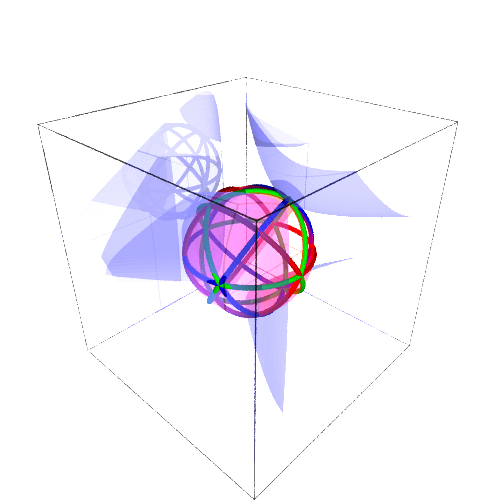

In [19]:
gee3 = P_threecurves + \
implicit_plot3d(g3==g3(y0=w1[0],y1=w1[1],y2=w1[2]),(y0,-2,2),(y1,-2,2),(y2,-2,2), plot_points=50, opacity=0.5) + \
implicit_plot3d(g3==g3(y0=w1[0],y1=w1[1],y2=w1[2]),(y0,-2,2),(y1,-2,2),(y2,-2,2), plot_points=50, color='green', opacity=0.5) + \
implicit_plot3d(y0^2+y1^2+y2^2==1,(y0,-1,1),(y1,-1,1),(y2,-1,1),color='red', opacity=0.25)

gee3.show(viewer='tachyon')

In [20]:
for wi in [w1,-w1,w2,-w2,w3,-w3,w4,-w4]:
    pretty_print( g4(y0=wi[0],y1=wi[1],y2=wi[2]) )

-62/309*sqrt(17)*sqrt(2)*sqrt(206/255)*pi^(3/4)

-62/309*sqrt(17)*sqrt(2)*sqrt(206/255)*pi^(3/4)

-62/309*sqrt(17)*sqrt(2)*sqrt(206/255)*pi^(3/4)

-62/309*sqrt(17)*sqrt(2)*sqrt(206/255)*pi^(3/4)

-62/309*sqrt(17)*sqrt(2)*sqrt(206/255)*pi^(3/4)

-62/309*sqrt(17)*sqrt(2)*sqrt(206/255)*pi^(3/4)

-62/309*sqrt(17)*sqrt(2)*sqrt(206/255)*pi^(3/4)

-62/309*sqrt(17)*sqrt(2)*sqrt(206/255)*pi^(3/4)

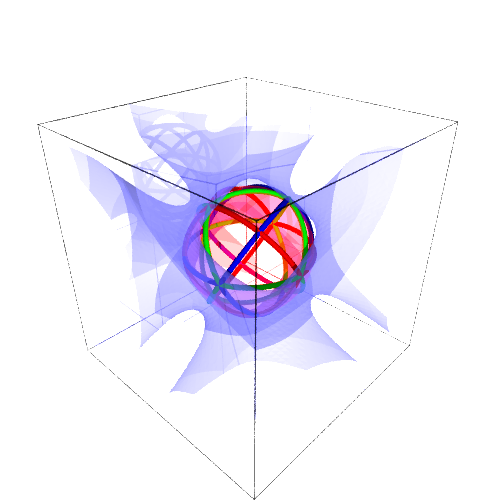

In [21]:
gee4 = P_threecurves + \
implicit_plot3d(g4==g4(y0=w1[0],y1=w1[1],y2=w1[2]),(y0,-2,2),(y1,-2,2),(y2,-2,2), plot_points=50, opacity=0.5) + \
implicit_plot3d(y0^2+y1^2+y2^2==1,(y0,-1,1),(y1,-1,1),(y2,-1,1),color='red', opacity=0.25)


#gee4.show(viewer='threejs')
gee4.show(viewer='tachyon')

In [22]:
#matrix([ [inner_product(ei,ej,ys) for ej in [g2,g3,g4,g3^4,g4^3] ] for ei in [g2,g3,g4,g3^4,g4^3]] )

In [23]:
def stereographic_proj(v):
    """ Standard Stereographic projection with possible pre-rotation about X, Y and Z axis"""
    w = vector(v)
    return (w[0]/(1-w[2]),w[1]/(1-w[2]))

def to_iso_spherical_coords(v):
    x, y, z = v
    r = sqrt(x^2+y^2+z^2)
    theta = arccos(z/r)
    phi = atan2(y,x)
    return (r,theta,phi)

def to_iso_sphere_coords(v):
    r, theta, phi = to_iso_spherical_coords(v)
    return (phi, theta) #(theta, phi)

In [24]:
P_twocurves = Graphics()

var('t')

# the 2-interations
for (wi, wj) in [(-w1,-w2), (-w1,-w3), (-w1,w4), (-w2,-w3), (-w2,w4), (-w3,w4)]:
    three_curve = cos(t)*wi+sin(t)*wj
    three_curve = three_curve/three_curve.norm()
    #two_curve = vector(stereographic_proj(three_curve)).simplify()
    two_curve = vector(to_iso_sphere_coords(three_curve)).simplify()
    if (wi == -w1 or wi == -w2) and wj == -w3:
        P_twocurves += parametric_plot(two_curve,
                             (t,0,arctan(1/2)-1e-2),
                             thickness=2,
                             color=rainbow(3)[0])
        P_twocurves += parametric_plot(two_curve,
                             (t,arctan(1/2)+1e-2,pi/2),
                             thickness=2,
                             color=rainbow(3)[0])
    else:
        P_twocurves += parametric_plot(two_curve,
                             (t,0,pi/2),
                             thickness=2,
                             color=rainbow(3)[0])
        
    if not( wi == -w1 and wj == -w2 ):
        P_twocurves += parametric_plot(two_curve,
                             (t,pi/2,pi),
                             thickness=2,
                             color=rainbow(3)[1])
    else:
        P_twocurves += parametric_plot(two_curve,
                             (t,pi/2,3*pi/4-1e-2),
                             thickness=2,
                             color=rainbow(3)[1])
        P_twocurves += parametric_plot(two_curve,
                             (t,3*pi/4+1e-2,pi),
                             thickness=2,
                             color=rainbow(3)[1])
        
    P_twocurves += parametric_plot(two_curve,
                         (t,pi,3*pi/2),
                         thickness=2,
                         color=rainbow(3)[2])
    if not( wi == -w1 and wj == -w2 ):
        P_twocurves += parametric_plot(two_curve,
                             (t,3*pi/2+1e-3,2*pi-1e-3),
                             thickness=2,
                             color=rainbow(3)[1])
    else:
        P_twocurves += parametric_plot(two_curve,
                             (t,3*pi/2, 7*pi/4-1e-4),
                             thickness=2,
                             color=rainbow(3)[1])
        P_twocurves += parametric_plot(two_curve,
                             (t,7*pi/4+1e-4,2*pi),
                             thickness=2,
                             color=rainbow(3)[1])
    


P_twocurves += point(to_iso_sphere_coords( w1), size=120, color='black')
P_twocurves[-1].set_zorder(10)
P_twocurves += point(to_iso_sphere_coords(-w1), size=120, color='black')
P_twocurves[-1].set_zorder(10)

P_twocurves += point(to_iso_sphere_coords( w2), size=120, color='black')
P_twocurves[-1].set_zorder(10)
P_twocurves += point(to_iso_sphere_coords(-w2), size=120, color='black')
P_twocurves[-1].set_zorder(10)

P_twocurves += point(to_iso_sphere_coords( w3), size=120, color='black')
P_twocurves[-1].set_zorder(10)
P_twocurves += point(to_iso_sphere_coords(-w3), size=120, color='black')
P_twocurves[-1].set_zorder(10)

P_twocurves += point(to_iso_sphere_coords( w4), size=120, color='black')
P_twocurves[-1].set_zorder(10)
P_twocurves += point(to_iso_sphere_coords(-w4), size=120, color='black')
P_twocurves[-1].set_zorder(10)

#P_twocurves.show(aspect_ratio=1,axes=False)

In [25]:
def legendre_poly(n):
    return diff( (x^2-1)^n, x, n)/(2^n*factorial(n))

def assoc_legendre_poly(m,l):
    if m >= 0:
        return (-1)^m * (1-x^2)^(m/2) *diff(legendre_poly(l),x,m)
    else:
        return (-1)^m * factorial(l-m) /factorial(l+m) * assoc_legendre_poly(-m,l)

def real_sh(m,l):
    return r^(l)*cos(m*phi)*assoc_legendre_poly(m,l)(x=cos(theta))

def imag_sh(m,l):
    return r^(l)*sin(m*phi)*assoc_legendre_poly(m,l)(x=cos(theta))

def polar_to_euclid(f):
    return ( f(theta=arccos(y2/r)) )(r=sqrt(y0^2+y1^2+y2^2), phi=atan2(y1,y0))

def euclid_real(m,l):
    return polar_to_euclid(real_sh(m,l)).simplify()

def euclid_imag(m,l):
    return polar_to_euclid(imag_sh(m,l)).simplify()

In [26]:
def euclid_to_sphere(f):
    return f(y0=r*sin(theta)*cos(phi),y1=r*sin(theta)*sin(phi),y2=r*cos(theta))

In [27]:
sym_fn_3 = 0
ell = 3
for wpi in [wp1, wp2, wp3, -wp4]:
    sym_fn_3 += (r^ell*gegenbauer(ell,4/2-1,
                                  (wpi/norm(wpi))*(vector(xs)/norm(vector(xs)))))\
    (r=sqrt(sum([xi^2 for xi in xs]))).simplify_full()
    
sym_fn_3.expand()

-8/3*sqrt(3)*x0^3 + 8/3*sqrt(3)*x0^2*x1 + 8/3*sqrt(3)*x0*x1^2 - 8/3*sqrt(3)*x1^3 + 8/3*sqrt(3)*x0^2*x2 - 16/3*sqrt(3)*x0*x1*x2 + 8/3*sqrt(3)*x1^2*x2 + 8/3*sqrt(3)*x0*x2^2 + 8/3*sqrt(3)*x1*x2^2 - 8/3*sqrt(3)*x2^3 + 8/3*sqrt(3)*x0^2*x3 - 16/3*sqrt(3)*x0*x1*x3 + 8/3*sqrt(3)*x1^2*x3 - 16/3*sqrt(3)*x0*x2*x3 - 16/3*sqrt(3)*x1*x2*x3 + 8/3*sqrt(3)*x2^2*x3 + 8/3*sqrt(3)*x0*x3^2 + 8/3*sqrt(3)*x1*x3^2 + 8/3*sqrt(3)*x2*x3^2 - 8/3*sqrt(3)*x3^3

In [28]:
pretty_print( (sym_fn_3(x0=x1,x1=x0)-sym_fn_3).expand() )
pretty_print( (sym_fn_3(x0=x2,x2=x0)-sym_fn_3).expand() )
pretty_print( (sym_fn_3(x0=x3,x3=x0)-sym_fn_3).expand() )

0

0

0

In [29]:
for wpi in [wp1, -wp1, wp2, -wp2, wp3, -wp3, wp4, -wp4]:
    pretty_print( sym_fn_3(x0=t*wpi[0],x1=t*wpi[1],x2=t*wpi[2],x3=t*wpi[3]))

64/9*t^3

-64/9*t^3

64/9*t^3

-64/9*t^3

64/9*t^3

-64/9*t^3

-64/9*t^3

64/9*t^3

In [30]:
sym_fn_4 = 0
ell = 4
for wpi in [wp1, -wp1, wp2, -wp2, wp3, -wp3, wp4, -wp4]:
    sym_fn_4 += (r^ell*gegenbauer(ell,4/2-1,
                                  (wpi/norm(wpi))*(vector(xs)/norm(vector(xs)))))\
    (r=sqrt(sum([xi^2 for xi in xs]))).simplify_full()
    
sym_fn_4.expand()

8/3*x0^4 - 80/9*x0^3*x1 - 16/3*x0^2*x1^2 - 80/9*x0*x1^3 + 8/3*x1^4 - 80/9*x0^3*x2 + 80/3*x0^2*x1*x2 + 80/3*x0*x1^2*x2 - 80/9*x1^3*x2 - 16/3*x0^2*x2^2 + 80/3*x0*x1*x2^2 - 16/3*x1^2*x2^2 - 80/9*x0*x2^3 - 80/9*x1*x2^3 + 8/3*x2^4 - 80/9*x0^3*x3 + 80/3*x0^2*x1*x3 + 80/3*x0*x1^2*x3 - 80/9*x1^3*x3 + 80/3*x0^2*x2*x3 - 64*x0*x1*x2*x3 + 80/3*x1^2*x2*x3 + 80/3*x0*x2^2*x3 + 80/3*x1*x2^2*x3 - 80/9*x2^3*x3 - 16/3*x0^2*x3^2 + 80/3*x0*x1*x3^2 - 16/3*x1^2*x3^2 + 80/3*x0*x2*x3^2 + 80/3*x1*x2*x3^2 - 16/3*x2^2*x3^2 - 80/9*x0*x3^3 - 80/9*x1*x3^3 - 80/9*x2*x3^3 + 8/3*x3^4

In [31]:
pretty_print( (sym_fn_4(x0=x1,x1=x0)-sym_fn_4).expand() )
pretty_print( (sym_fn_4(x0=x2,x2=x0)-sym_fn_4).expand() )
pretty_print( (sym_fn_4(x0=x3,x3=x0)-sym_fn_4).expand() )

0

0

0

In [32]:
for wpi in [wp1, -wp1, wp2, -wp2, wp3, -wp3, wp4, -wp4]:
    pretty_print( sym_fn_4(x0=t*wpi[0],x1=t*wpi[1],x2=t*wpi[2],x3=t*wpi[3]), end='  ' )

248/27*t^4

248/27*t^4

248/27*t^4

248/27*t^4

248/27*t^4

248/27*t^4

248/27*t^4

248/27*t^4

In [33]:
sym_fn_12 = 0
ell = 12
for wpi in [wp1, wp2, wp3, -wp4]:
    sym_fn_12 += (r^ell*gegenbauer(ell,4/2-1,
                                   (wpi/norm(wpi))*(vector(xs)/norm(vector(xs)))))\
    (r=sqrt(sum([xi^2 for xi in xs]))).simplify_full()
    
#sym_fn_12.expand()

In [34]:
pretty_print( (sym_fn_12(x0=x1,x1=x0)-sym_fn_12).expand() )
pretty_print( (sym_fn_12(x0=x2,x2=x0)-sym_fn_12).expand() )
pretty_print( (sym_fn_12(x0=x3,x3=x0)-sym_fn_12).expand() )

0

0

0

In [35]:
for wpi in [wp1, -wp1, wp2, -wp2, wp3, -wp3, wp4, -wp4]:
    pretty_print( sym_fn_12(x0=t*wpi[0],x1=t*wpi[1],x2=t*wpi[2],x3=t*wpi[3]), end='  ' )

2139292/177147*t^12

2139292/177147*t^12

2139292/177147*t^12

2139292/177147*t^12

2139292/177147*t^12

2139292/177147*t^12

2139292/177147*t^12

2139292/177147*t^12

In [36]:
def rep_lap(f,k,vrs):
    if k <= 0:
        return f
    elif k == 1:
        return lap(f,vrs)
    else:
        return lap(rep_lap(f,k-1,vrs),vrs)
    
def semi_factorial(n):
    if n <= 1:
        return 1
    else:
        return n*semi_factorial(n-2)
    
def harmonic_leading_term(f,n,vrs):
    r_sq = sum([vi^2 for vi in vrs])
    d = len(vrs)
    return sum([ ((-1)^k)*semi_factorial(d+2*n-2*k-4) \
                / ( semi_factorial(2*k) * semi_factorial(d+2*n-4) ) \
                * (r_sq^k) * rep_lap(f,k,vrs) for k in range(floor(n/2)+1)])

In [37]:
def lap(f,vrs):
    return sum([diff(f,vi,2) for vi in vrs])

In [38]:
lap(harmonic_leading_term(p3,3,xs).expand(),xs)

0

In [39]:
sym_fn_3_4 = harmonic_leading_term(sym_fn_3^4,12,xs).simplify().expand()
sym_fn_4_3 = harmonic_leading_term(sym_fn_4^3,12,xs).simplify().expand()

In [40]:
pretty_print( lap(sym_fn_3_4, xs).simplify_full() )
pretty_print( lap(sym_fn_4_3, xs).simplify_full() )

0

0

In [41]:
#sym_fn_12p = (((sym_fn_3^4)/(sym_fn_3^4)(x0=wp1[0],x1=wp1[1],x2=wp1[2],x3=wp1[3])) - \
#              (sym_fn_4^3)/(sym_fn_4^3)(x0=wp1[0],x1=wp1[1],x2=wp1[2],x3=wp1[3])).expand()

sym_fn_12p = (((sym_fn_3_4)/(sym_fn_3_4)(x0=wp1[0],x1=wp1[1],x2=wp1[2],x3=wp1[3])) - \
              (sym_fn_4_3)/(sym_fn_4_3)(x0=wp1[0],x1=wp1[1],x2=wp1[2],x3=wp1[3])).expand()


#sym_fn_12p

In [42]:
for wpi in [wp1, -wp1, wp2, -wp2, wp3, -wp3, wp4, -wp4]:
    pretty_print( sym_fn_12p(x0=t*wpi[0],x1=t*wpi[1],x2=t*wpi[2],x3=t*wpi[3]), end=' ' )

0

0

0

0

0

0

0

0

In [43]:
lap(sym_fn_12p,xs).simplify()

0

In [44]:
wv = sym_fn_12p(*(Pm*Qm*vector(ys))).simplify_full().expand()

In [45]:
lap(wv,ys).simplify_full().expand()

3296305543680/6005211269*sqrt(2)*y0^7*y1^3 - 500362450560/6005211269*sqrt(2)*y0^5*y1^5 - 1639229195520/6005211269*sqrt(2)*y0^3*y1^7 + 1201537869440/6005211269*sqrt(2)*y0*y1^9 - 9888916631040/6005211269*sqrt(2)*y0^7*y1*y2^2 + 1000724901120/6005211269*sqrt(2)*y0^5*y1^3*y2^2 + 1639229195520/6005211269*sqrt(2)*y0^3*y1^5*y2^2 - 3128403041280/6005211269*sqrt(2)*y0*y1^7*y2^2 + 1501087351680/6005211269*sqrt(2)*y0^5*y1*y2^4 + 8196145977600/6005211269*sqrt(2)*y0^3*y1^3*y2^4 + 4261583934720/6005211269*sqrt(2)*y0*y1^5*y2^4 + 4917687586560/6005211269*sqrt(2)*y0^3*y1*y2^6 - 16216709376000/6005211269*sqrt(2)*y0*y1^3*y2^6 - 2561812594560/6005211269*sqrt(2)*y0*y1*y2^8 - 517980459520/6005211269*y0^10 + 107612997120/316063751*y0^8*y1^2 - 4567281989760/6005211269*y0^6*y1^4 + 520862032320/6005211269*y0^4*y1^6 - 2894382803520/6005211269*y0^2*y1^8 - 3878634240/316063751*y1^10 + 107612997120/316063751*y0^8*y2^2 - 9134563979520/6005211269*y0^6*y1^2*y2^2 + 19432183377600/6005211269*y0^4*y1^4*y2^2 + 302178806092

In [46]:
for wpi in [w1, -w1, w2, -w2, w3, -w3, w4, -w4]:
    pretty_print( wv(y0=t*wpi[0],y1=t*wpi[1],y2=t*wpi[2]), end='  ')

0

0

0

0

0

0

0

0

In [47]:
sphere_wv = euclid_to_sphere(wv).simplify_full()(r=1).simplify_full()

In [48]:
sphere_wv = sphere_wv/integrate(integrate(sphere_wv,phi,-pi,pi)*sin(theta),theta,0,pi)

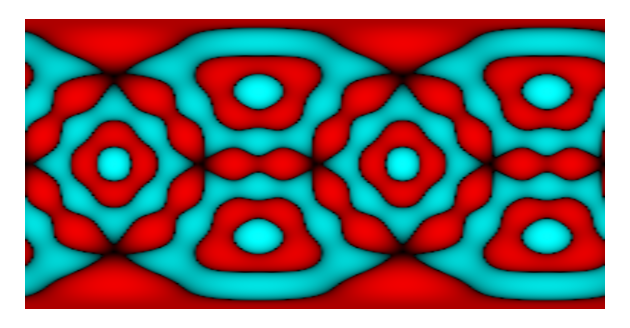

In [49]:
P_sphere_wv = complex_plot(lambda z: sphere_wv(theta=z.imag_part(),phi=z.real_part()),
                           (phi,-pi,pi), (theta,0,pi), # cmap=cm.viridis,
                           plot_points=200,aspect_ratio=1,axes=False)

P_sphere_wv.show()

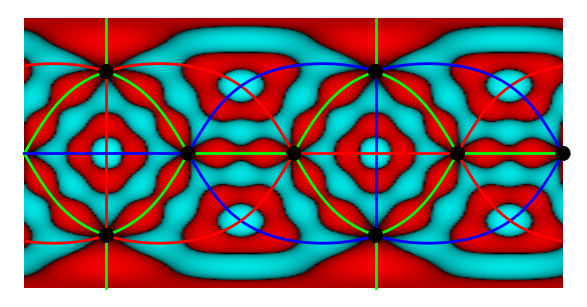

In [50]:
P_sphere_wv + P_twocurves

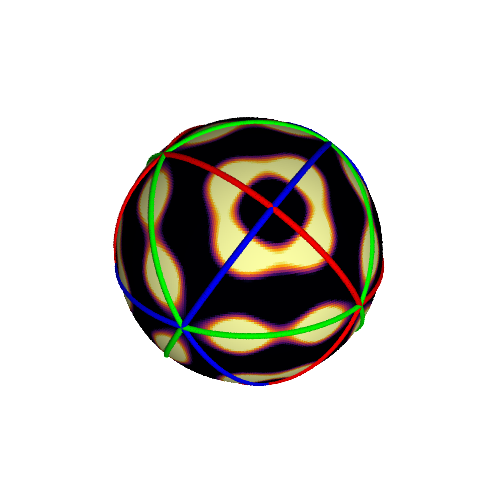

In [51]:
def cf(theta,phi): return float(sphere_wv(theta=theta,phi=phi))

osph = P_threecurves + parametric_plot3d( (sin(theta)*cos(phi),
                                           sin(theta)*sin(phi),
                                           cos(theta)),
                                         (theta,0,pi), (phi,-pi,pi), 
                                         color=(cf,cm.inferno), 
                                         plot_points=[200,400],
                                         frame=False)

osph.show(viewer='tachyon')

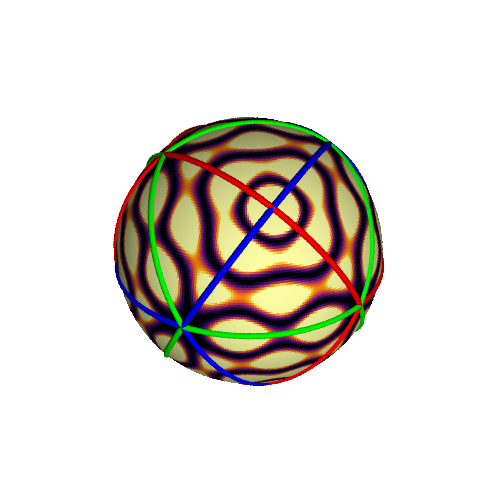

In [52]:
def cf(theta,phi): return float(sphere_wv(theta=theta,phi=phi)^2)

osph = P_threecurves + parametric_plot3d( (sin(theta)*cos(phi),
                                           sin(theta)*sin(phi),
                                           cos(theta)),
                                         (theta,0,pi), (phi,-pi,pi), 
                                         color=(cf,cm.inferno), 
                                         plot_points=[200,400],
                                         frame=False)

osph.show(viewer='tachyon')

In [53]:
mn = float('inf')
mx = float('-inf')
for th, fi in zip(np.linspace(0,N(pi),100),np.linspace(-N(pi),N(pi),200)):
    vl = N(sphere_wv(theta=th,phi=fi))
    mn = min(mn,vl)
    mx = max(mx,vl)
    
mn, mx    

(-2.14213248564716, 1.77861925736231)

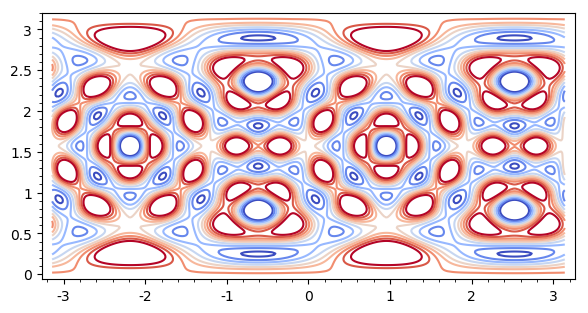

In [54]:
contours = set(list(np.linspace(mn+0.5,0,5))+list(np.linspace(0,mx-0.5,5)))
contours = list(contours)
contours.sort()

P_contours = contour_plot(sphere_wv, (phi,-pi,pi), (theta,0,pi), 
             cmap=cm.coolwarm,
             contours=contours,
             plot_points=[400,200],
             aspect_ratio=1,
             axes=False,
             fill=False)

P_contours

In [55]:
P_contours.save('contours.pdf')

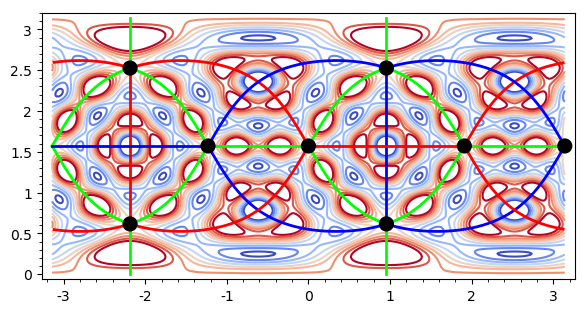

In [56]:
P_contours + P_twocurves

In [57]:
sphere_plot = spherical_plot3d((sphere_wv/(5+max(mx,abs(mn))))+1, 
                               (phi,-pi,pi), (theta,0,pi),
                               opacity=0.75,
                               plot_points=200,
                               aspect_ratio=1)
sphere_plot += implicit_plot3d(x^2+y^2+z^2==1,
                               (x,-1,1), (y,-1,1), (z,-1,1),
                               opacity=0.5,
                               color='red',
                               frame=False)
sphere_plot += P_threecurves
sphere_plot.show(viewer='threejs')

Graphics3d Object

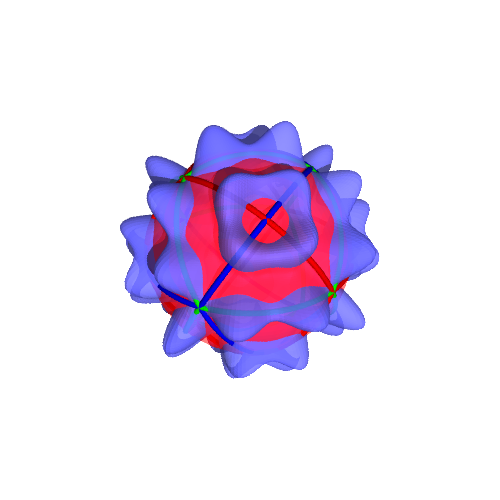

In [58]:
sphere_plot.show(viewer='tachyon')

In [59]:
prob_sphere_plot = spherical_plot3d((sphere_wv^2)/(20+max(mn^2,mx^2))+1,
                                    (phi,-pi,pi), (theta,0,pi),
                                    opacity=0.75,
                                    plot_points=200,
                                    aspect_ratio=1,
                                    frame=False)
#prob_sphere_plot += implicit_plot3d(x^2+y^2+z^2==1,
#                               (x,-1,1), (y,-1,1), (z,-1,1),
#                               opacity=0.5,
#                               color='red',
#                               frame=False)
prob_sphere_plot += P_threecurves
prob_sphere_plot.show(viewer='threejs')

Graphics3d Object

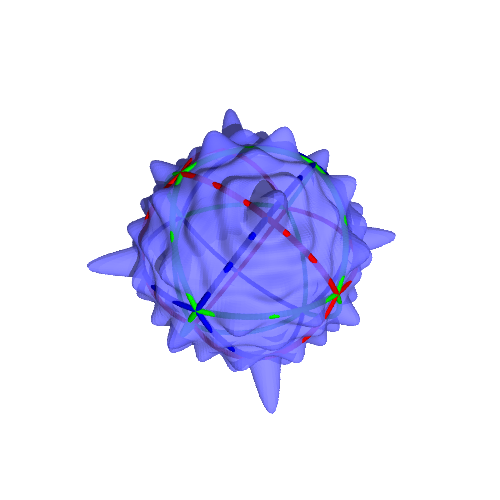

In [60]:
prob_sphere_plot.show(viewer='tachyon')

In [61]:
wavef4 = sym_fn_12p

In [62]:
print( (wavef4(x0=x1,x1=x0)-wavef4).expand() )
print( (wavef4(x0=x2,x2=x0)-wavef4).expand() )
print( (wavef4(x0=x3,x3=x0)-wavef4).expand() )

0
0
0


In [63]:
R.<x0,x1,x2,x3> = PolynomialRing(AA)
a_wavef4 = R(wavef4)
a_e1 = R(e1)
a_e2 = R(e2)
a_e3 = R(e3)
a_e4 = R(e4)
a_p1 = R(p1)
a_p2 = R(p2)
a_p3 = R(p3)
a_p4 = R(p4)

In [64]:
def get_monomials():
    from itertools import product
    powers = [ (exp1,exp2,exp3,exp4) for exp1, exp2, exp3, exp4 in product(range(0,13),repeat=4) if 1*exp1+2*exp2+3*exp3+4*exp4 == 12]
    monomials = set()
    for (exp1,exp2,exp3,exp4) in powers:
        monomials = monomials.union((a_e1^exp1*a_e2^exp2*a_e3^exp3*a_e4^exp4).dict().keys())
    monomials = list(monomials)
    monomials.sort()
    basis_dict = { mon: n for n, mon in enumerate(monomials)}
    rev_basis_dict = { n: mon for n, mon in enumerate(monomials)}
    return basis_dict, rev_basis_dict
    
basis_dict, rev_basis_dict = get_monomials()
dim = len(basis_dict)

In [65]:
def poly_to_vec(p):
    dp = p.dict()
    return vector([ dp[monomial] if monomial in dp else 0 for monomial in basis_dict.keys()])
        
def get_sym_matrix():
    from itertools import product
    powers = [(exp1,exp2,exp3,exp4) 
              for exp1, exp2, exp3, exp4 in product(range(0,13),repeat=4) 
              if 1*exp1+2*exp2+3*exp3+4*exp4 == 12]
    return matrix([poly_to_vec(a_e1^exp1*a_e2^exp2*a_e3^exp3*a_e4^exp4) 
                   for (exp1,exp2,exp3,exp4) in powers ])

print( get_sym_matrix().dimensions() )

mat = get_sym_matrix()

(34, 455)


In [66]:
v_wavef4 = poly_to_vec(a_wavef4)

In [67]:
#mat.transpose().augment(v_wavef4).transpose().rref()

In [68]:
efs = var(['ef{}'.format(n) for n in range(34)])

vefs = vector(efs)

In [69]:
import itertools
for eqn in zip(solve(list(vefs*mat - v_wavef4), list(efs))[0], 
               [(exp1,exp2,exp3,exp4) 
                for exp1, exp2, exp3, exp4 in itertools.product(range(0,13),repeat=4) 
                if 1*exp1+2*exp2+3*exp3+4*exp4 == 12]):
    pretty_print(eqn)

(ef0 == (24914165760/71849), (0, 0, 0, 3))

(ef1 == (1149603840/83581), (0, 0, 4, 0))

(ef2 == (225245018972160/6005211269), (0, 1, 2, 1))

(ef3 == (-724225025064960/6005211269), (0, 2, 0, 2))

(ef4 == (3464918830080/6005211269), (0, 3, 2, 0))

(ef5 == (61560972840960/6005211269), (0, 4, 0, 1))

(ef6 == (-421869035520/6005211269), (0, 6, 0, 0))

(ef7 == (-18685624320/71849), (1, 0, 1, 2))

(ef8 == (-221507027343360/6005211269), (1, 1, 3, 0))

(ef9 == (136867493560320/6005211269), (1, 2, 1, 1))

(ef10 == (-18855162040320/6005211269), (1, 4, 1, 0))

(ef11 == (277818282086400/6005211269), (2, 0, 2, 1))

(ef12 == (870640321904640/6005211269), (2, 1, 0, 2))

(ef13 == (139473268485120/6005211269), (2, 2, 2, 0))

(ef14 == (-108777040081920/6005211269), (2, 3, 0, 1))

(ef15 == (4531103838720/6005211269), (2, 5, 0, 0))

(ef16 == (36917837890560/6005211269), (3, 0, 3, 0))

(ef17 == (-266386396723200/6005211269), (3, 1, 1, 1))

(ef18 == (-17767701780480/6005211269), (3, 3, 1, 0))

(ef19 == (-181056256266240/6005211269), (4, 0, 0, 2))

(ef20 == (-54900479064960/6005211269), (4, 1, 2, 0))

(ef21 == (87370438717440/6005211269), (4, 2, 0, 1))

(ef22 == (-1992748406400/6005211269), (4, 4, 0, 0))

(ef23 == (62372500761600/6005211269), (5, 0, 1, 1))

(ef24 == (15397553174400/6005211269), (5, 2, 1, 0))

(ef25 == (4467837424320/6005211269), (6, 0, 2, 0))

(ef26 == (-28600310240640/6005211269), (6, 1, 0, 1))

(ef27 == (-29375591040/6005211269), (6, 3, 0, 0))

(ef28 == (-2878279888320/6005211269), (7, 1, 1, 0))

(ef29 == (3065016778560/6005211269), (8, 0, 0, 1))

(ef30 == (62942237280/6005211269), (8, 2, 0, 0))

(ef31 == (129390481440/6005211269), (9, 0, 1, 0))

(ef32 == (4425380640/6005211269), (10, 1, 0, 0))

(ef33 == (-1218136860/6005211269), (12, 0, 0, 0))

In [70]:
e43_coeff = solve(list(vefs*mat - v_wavef4), list(efs))[0][0].rhs()
e34_coeff = solve(list(vefs*mat - v_wavef4), list(efs))[0][1].rhs()

semi_wave = (e34_coeff*e3^4 + e43_coeff*e4^3).expand()

semi_wave

1149603840/83581*x0^4*x1^4*x2^4 + 4598415360/83581*x0^4*x1^4*x2^3*x3 + 4598415360/83581*x0^4*x1^3*x2^4*x3 + 4598415360/83581*x0^3*x1^4*x2^4*x3 + 6897623040/83581*x0^4*x1^4*x2^2*x3^2 + 13795246080/83581*x0^4*x1^3*x2^3*x3^2 + 13795246080/83581*x0^3*x1^4*x2^3*x3^2 + 6897623040/83581*x0^4*x1^2*x2^4*x3^2 + 13795246080/83581*x0^3*x1^3*x2^4*x3^2 + 6897623040/83581*x0^2*x1^4*x2^4*x3^2 + 4598415360/83581*x0^4*x1^4*x2*x3^3 + 13795246080/83581*x0^4*x1^3*x2^2*x3^3 + 13795246080/83581*x0^3*x1^4*x2^2*x3^3 + 13795246080/83581*x0^4*x1^2*x2^3*x3^3 + 4064700159590400/6005211269*x0^3*x1^3*x2^3*x3^3 + 13795246080/83581*x0^2*x1^4*x2^3*x3^3 + 4598415360/83581*x0^4*x1*x2^4*x3^3 + 13795246080/83581*x0^3*x1^2*x2^4*x3^3 + 13795246080/83581*x0^2*x1^3*x2^4*x3^3 + 4598415360/83581*x0*x1^4*x2^4*x3^3 + 1149603840/83581*x0^4*x1^4*x3^4 + 4598415360/83581*x0^4*x1^3*x2*x3^4 + 4598415360/83581*x0^3*x1^4*x2*x3^4 + 6897623040/83581*x0^4*x1^2*x2^2*x3^4 + 13795246080/83581*x0^3*x1^3*x2^2*x3^4 + 6897623040/83581*x0^2*x1^4*x2^

In [71]:
semi_wave(x0=wp1[0],x1=wp1[1],x2=wp1[2],x3=wp1[3])

94473871360/6005211269

In [81]:
phi1, phi2 = var('phi1,phi2')
assume(phi1,'real')
assume(phi2,'real')

sphere_wv = wavef4(x0=r*cos(phi1),
                   x1=r*sin(phi1)*cos(phi2),
                   x2=r*sin(phi1)*sin(phi2)*cos(theta),
                   x3=r*sin(phi1)*sin(phi2)*sin(theta))(r=1)

In [87]:
us = var(['u{}'.format(n) for n in range(4)])
for ui in us:
    assume(ui,'real')

u_vec = vector(us)

var_geg12 = gegenbauer(12,4/2-1, u_vec*(vector(xs)/norm(vector(xs))))\
            (x0=r*cos(phi1),
             x1=r*sin(phi1)*cos(phi2),
             x2=r*sin(phi1)*sin(phi2)*cos(theta),
             x3=r*sin(phi1)*sin(phi2)*sin(theta))\
            (r=1)

In [ ]:
integrate((var_geg12*sphere_wv*sin(phi1)^2*sin(phi2)).expand(),phi1,0,pi)